<a href="https://colab.research.google.com/github/bebechien/pighouse/blob/master/shinyunbok.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Shin Yun-bok painting generator

![a_girl_looking_tablet_pc2.png](https://huggingface.co/bebechien/shinyunbok/resolve/main/a_girl_looking_tablet_pc2.png)
This note uses diffusers & a custom model trained with the style of famous Korean ink wash painter, Shin Yun-Bok.
https://civitai.com/models/27670/shinyunbok

### Step 1. Install requirements (Note: you have to restart the runtime once it's finished)

In [ ]:
!pip install --upgrade diffusers accelerate transformers omegaconf xformers

### Step 2. Clone diffusers, download custom model, build the pipeline and define image grid function

In [ ]:
!git clone https://github.com/huggingface/diffusers
%cd diffusers

import torch
from diffusers import DiffusionPipeline, EulerAncestralDiscreteScheduler

pipe = DiffusionPipeline.from_pretrained("bebechien/shinyunbok_v21MercurySD21", torch_dtype=torch.float16).to("cuda")
pipe.enable_xformers_memory_efficient_attention()
pipe.scheduler = EulerAncestralDiscreteScheduler.from_config(pipe.scheduler.config)

from PIL import Image

def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

### Step 3. Generate images (you might want to change **"your_prompt"** string)

  0%|          | 0/20 [00:00<?, ?it/s]

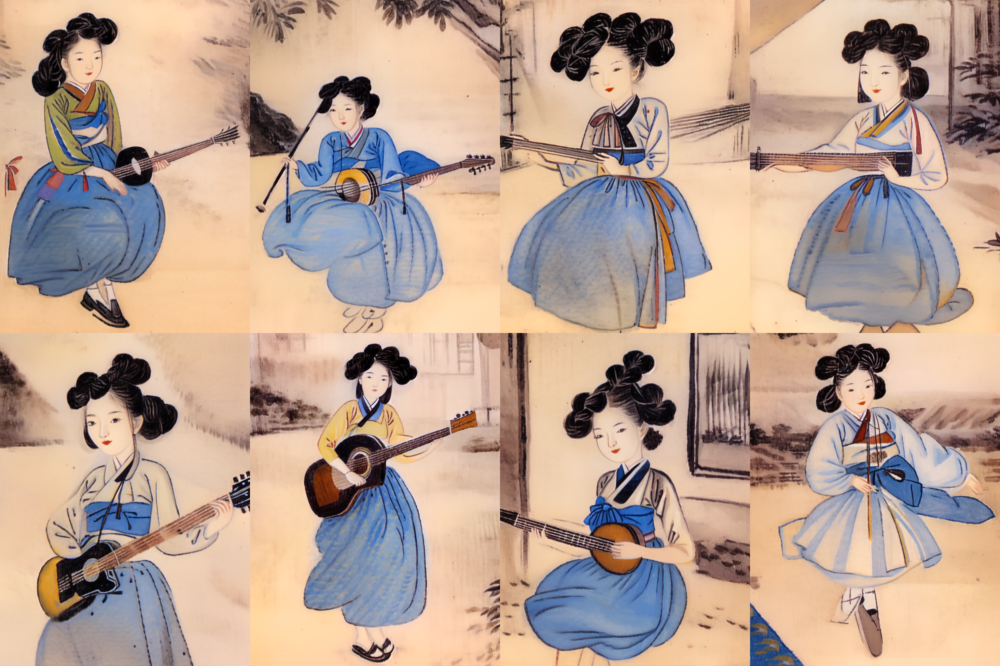

In [ ]:
your_prompt = "a girl playing guitar"
width = 768
height = 1024
num_images = 8

recommended_prompt = "shinyunbok anime, (exceptional, best aesthetic, new, newest, best quality, masterpiece, extremely detailed, waifu:1.2), "
negative_prompt = "((photo, realistic)), lowres, ((bad anatomy)), ((bad hands)), missing finger, extra digits, fewer digits, blurry, ((mutated hands and fingers)), (poorly drawn face), ((mutation)), ((deformed face)), (ugly), ((bad proportions)), ((extra limbs)), extra face, (double head), (extra head), ((extra feet)), monster, logo, cropped, worst quality, jpeg, humpbacked, long body, long neck, ((jpeg artifacts)), deleted, old, oldest, ((censored)), ((bad aesthetic)), (mosaic censoring, bar censor, blur censor)"

images = pipe(recommended_prompt + your_prompt, negative_prompt=negative_prompt, width=width, height=height, num_images_per_prompt=num_images, num_inference_steps=20, guidance_scale=7).images
grid = image_grid(images, rows=2, cols=4)
grid


### Epilogue

That's it. Hope you enjoyed his painting. :)